# Finite-Time Lyapunov Exponent (FTLE) with Continuous Velocity Field
We present two examples where the FTLE is calculated from known continuous velocity fields as opposed to discrete fields specified at grid points.
The first example demonstrates a simple FTLE analysis and lays the conceptual foundation for later analysis on discrete data. The second example showcases an issue of sliding-window FTLE analysis.

Note: Both examples make use of multi-threading to speed up ODE calculations. Type `JULIA_NUM_THREADS=<num_threads> julia` when starting Julia in the Terminal (replace <num_threads> with the number of threads you want to use on your device).

In [1]:
using ILMPostProcessing
using Plots
using Base.Threads
using OrdinaryDiffEq

## Check the Number of Threads Used

In [2]:
Threads.nthreads()

1

## Example 1: Unsteady Double Gyre
This example replicates the time-dependent double gyre from Shadden 2005. The double gyre velocity field's specification can be found at https://shaddenlab.berkeley.edu/uploads/LCS-tutorial/examples.html#Sec7.1. The results in this simulation is highly similar.
### Generate Initial Conditions

In [3]:
X_MIN = 0.0
X_MAX = 2.0
Y_MIN = 0.0
Y_MAX = 1.0
nx = 1000
ny = 500

initial_conditions, dx, dy = ILMPostProcessing.gen_init_conds(X_MIN, X_MAX, Y_MIN, Y_MAX, nx, ny);

### Define the Double Gyre's Vector Field

In [4]:
function vectorField!(dz, z, p, t)
    A = 0.1
    epsilon = 0.25
    omega = 2 * π / 10

    a(s) = epsilon * sin(omega * s)
    b(s) = 1 - 2 * epsilon * sin(omega * s)
    f(x, t) = a(t) * x^2 + b(t) * x
    dfdx(x, t) = 2 * a(t) * x + b(t)

    @threads for i in 1:size(z, 1)
        x = z[i, 1]
        y = z[i, 2]
        u = -π * A * sin(π * f(x, t)) * cos(π * y)
        v = π * A * cos(π * f(x, t)) * sin(π * y) * dfdx(x, t)

        dz[i, 1] = u
        dz[i, 2] = v
    end
end

vectorField! (generic function with 1 method)

### Solve the Forward and Backward IVP

In [5]:
t0 = 0.0
T = 12
tspan_forward = (t0, T)
tspan_backward = (t0, -T)

@time begin
    prob_forward = ODEProblem(vectorField!, initial_conditions, tspan_forward, [nx, ny])
    sol_forward = solve(prob_forward, Tsit5());
end

final_values_forward = sol_forward.u[end]

@time begin
    prob_backward = ODEProblem(vectorField!, initial_conditions, tspan_backward, [nx, ny])
    sol_backward = solve(prob_backward, Tsit5());
end

final_values_backward = sol_backward.u[end];

  3.246240 seconds (3.09 M allocations: 1.412 GiB, 1.59% gc time, 20.52% compilation time)
  2.997996 seconds (1.10 k allocations: 1.207 GiB, 16.62% gc time)


### Compute the Forward and Backward FTLEs

In [6]:
FTLE_f = zeros(Float64, ny - 2, nx - 2)
@time compute_FTLE!(FTLE_f, nx, ny, T, final_values_forward, dx, dy)

FTLE_b = zeros(Float64, ny - 2, nx - 2)
@time compute_FTLE!(FTLE_b, nx, ny, T, final_values_backward, dx, dy)

x = range(X_MIN, X_MAX, length=nx - 2)
y = range(Y_MIN, Y_MAX, length=ny - 2);

  0.303193 seconds (401.72 k allocations: 124.590 MiB, 95.12% compilation time)
  0.013780 seconds (66 allocations: 98.636 MiB)


Plot the FTLEs on Top of Each Other

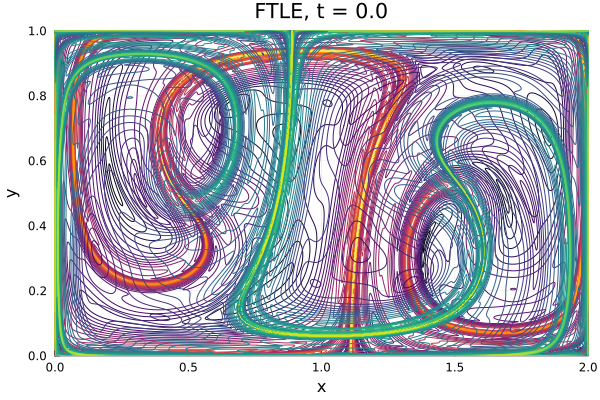

In [7]:
contour(x, y, FTLE_f, fill=false, title="FTLE, t = $t0", xlabel="x", ylabel="y", colorbar=false, levels = 30, c=:inferno)
contour!(x, y, FTLE_b, fill=false, colorbar=false, levels = 30, c=:viridis)

The code here creates a gif

    @time @gif for t0 in 0.0:1.0:10.0
    print(t0)
    tspan_forward = (t0, t0 + T)
    tspan_backward = (t0, t0 - T)

    # forward IVP
    prob_forward = ODEProblem(vectorField3!, initial_conditions, tspan_forward, [nx, ny])
    sol_forward = solve(prob_forward, Tsit5());

    final_values_forward = sol_forward[end];

    prob_backward = ODEProblem(vectorField3!, initial_conditions, tspan_backward, [nx, ny])
    sol_backward = solve(prob_backward, Tsit5());

    # backward IVP
    final_values_backward = sol_backward[end];

    # Compute forward FTLE
    FTLE_f = zeros(Float64, ny - 2, nx - 2)
    compute_FTLE!(FTLE_f, nx, ny, T, final_values_forward, dx, dy)

    # Compute backward FTLE
    FTLE_b = zeros(Float64, ny - 2, nx - 2)
    compute_FTLE!(FTLE_b, nx, ny, T, final_values_backward, dx, dy);

    # Plot FTLE
    x = range(X_MIN, X_MAX, length=nx - 2)
    y = range(Y_MIN, Y_MAX, length=ny - 2)

    contour(x, y, FTLE_f, fill=false, title="FTLE, t = $t0", xlabel="x", ylabel="y", colorbar=false, levels = 30, c=:inferno)
    contour!(x, y, FTLE_b, fill=false, colorbar=false, levels = 30, c=:viridis)
    end every 1 fps = 2

## Example 2 - Issues with the Sliding-Window Approach
The sliding-window approach attempts to detect Langragian coherent structures (LCS) by computing the FTLE fields over windows of the form [t0, t0 + T] with varying t0 values. However, this approach does not obey Lagrangian invariance because the LCS's at different t0 values do not evolve into each other (Haller 2015).

This example illustrates the point above.

### First, generate initial conditions.

In [8]:
X_MIN = -6.0
X_MAX = 50.0
Y_MIN = -2
Y_MAX = 2
nx = 1400
ny = 100

initial_conditions, dx, dy = ILMPostProcessing.gen_init_conds(X_MIN, X_MAX, Y_MIN, Y_MAX, nx, ny)

([-6.0 -2.0; -6.0 -1.9595959595959596; … ; 50.0 1.9595959595959596; 50.0 2.0], 0.040028591851322126, 0.04040404040404044)

### Define the Vector Field

In [9]:
function vectorField2!(dz, z, p, t)
    @threads for i in 1:size(z, 1)
        x = z[i, 1]
        y = z[i, 2]
        u = 1 + tanh(x)^2
        v = -2 * tanh(x) / cosh(x)^2 * y

        dz[i, 1] = u
        dz[i, 2] = v
    end
end

vectorField2! (generic function with 1 method)

### Solve the IVP and Compute FTLEs with the Sliding-Window Approach
As shown in the figure,although the flow is unsteady, the actual LCS is a material line that moves with the flow to the right. Nevertheless, as shown in the gif below, when t0 varies from 0.0 to 10.0, the forward FTLE fields reveals a repelling LCS fixed on the y-axis.

![Lack of Lagrangian Invariance](https://github.com/qiyuanbillwu/ILMPostProcessing.jl/raw/master/Lagrangian_Invariance.png)

[ Info: Saved animation to /var/folders/xl/gr8m_0f975dc22nqbqlj0x0c0000gn/T/jl_zgvSjWtMJE.gif
  7.147699 seconds (630.46 k allocations: 5.661 GiB, 44.30% gc time, 2.50% compilation time: 8% of which was recompilation)


Plots.AnimatedGif("/var/folders/xl/gr8m_0f975dc22nqbqlj0x0c0000gn/T/jl_zgvSjWtMJE.gif")
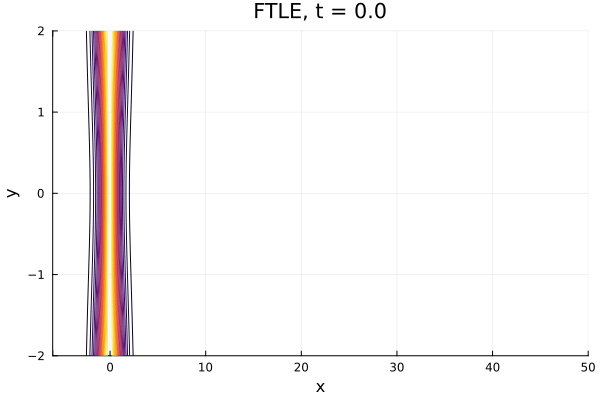

In [10]:
T = 5

@time @gif for t0 in 0.0:0.5:10.0
    tspan_forward = (t0, t0 + T)

    prob_forward = ODEProblem(vectorField2!, initial_conditions, tspan_forward, [nx, ny])
    sol_forward = solve(prob_forward, Tsit5());
    final_values_forward = sol_forward.u[end];

    FTLE_f = zeros(Float64, ny - 2, nx - 2)
    compute_FTLE!(FTLE_f, nx, ny, T, final_values_forward, dx, dy)

    x = range(X_MIN, X_MAX, length=nx - 2)
    y = range(Y_MIN, Y_MAX, length=ny - 2)
    contour(x, y, FTLE_f, fill=false, title="FTLE, t = $t0", xlabel="x", ylabel="y", colorbar=false, levels = 20)
end every 1 fps = 2

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*